In [1]:
import pandas as pd
import numpy as np
import sklearn

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

In [3]:
train = pd.read_csv("./data/train.csv")
train.head(10).T

,0,1,2,3,4,5,6,7,8,9
ID,FIN1000565,FIN1006019,FIN1004023,FIN1002470,FIN1006889,FIN1008922,FIN1003217,FIN1000505,FIN1006488,FIN1002488
Office_PIN,400705,390020,695014,713303,224001,360001,400705,110034,560001,250001
Application_Receipt_Date,4/30/2007,12/11/2007,9/26/2007,7/13/2007,1/26/2008,6/5/2008,8/14/2007,4/28/2007,1/2/2008,7/14/2007
Applicant_City_PIN,400705,390010,695583,713367,224172,360405,400704,110007,560029,245101
Applicant_Gender,M,M,F,M,F,F,F,M,M,M
Applicant_BirthDate,4/14/1966,8/26/1951,4/14/1983,1/16/1957,11/10/1974,6/9/1977,5/20/1979,10/27/1986,3/26/1977,1/9/1978
Applicant_Marital_Status,M,M,S,M,M,M,M,S,M,S
Applicant_Occupation,Business,Salaried,Salaried,Business,Business,Others,Business,Business,Salaried,Business
Applicant_Qualification,Class XII,Graduate,Class XII,Class XII,Graduate,Graduate,Class XII,Class XII,Class XII,Class XII
Manager_DOJ,NaN,9/8/2006,6/25/2007,9/19/2001,6/7/2006,12/24/2007,9/20/2006,1/10/2007,11/14/2007,8/8/2005


In [4]:
print(train.shape[0])
train = train.dropna()
print(train.shape[0])

7622
6559


In [5]:
from create_features import create_features
from datetime import datetime
from datetime import date
from dateutil.relativedelta import relativedelta
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

encoders = {
    
}

def create_features(data, mode = "train"):

    data["Application_Receipt_Date"] = pd.to_datetime(data["Application_Receipt_Date"], format= '%m/%d/%Y')
    data["Manager_DoB"] = pd.to_datetime(data["Manager_DoB"], format= '%m/%d/%Y')
    data["Applicant_BirthDate"] = pd.to_datetime(data["Applicant_BirthDate"], format= '%m/%d/%Y')
    data["Manager_DOJ"] = pd.to_datetime(data["Manager_DOJ"], format= '%m/%d/%Y')

    data['Manager_Age'] = [relativedelta(d1, d2).years for d1,d2 in zip(data["Application_Receipt_Date"],data["Manager_DoB"])]
    data['Applicant_Age'] = [relativedelta(d1, d2).years for d1,d2 in zip(data["Application_Receipt_Date"],data["Applicant_BirthDate"])]
    data['Manager_Experience'] = [relativedelta(d1, d2).years for d1,d2 in zip(data["Application_Receipt_Date"],data["Manager_DOJ"])]
    try:
        data["Manager_Joining_Designation"] = data["Manager_Joining_Designation"].apply(lambda x: int(x.split(" ")[-1]) if x!="Other" else -1 )
    except:
        pass
    try:
        data["Manager_Current_Designation"] = data["Manager_Current_Designation"].apply(lambda x: int(x.split(" ")[-1]))
    except:
        pass

    data["Manager_Promotion"] = data["Manager_Current_Designation"] - data["Manager_Joining_Designation"]

    data["Applicant_Select"] = data["Manager_Num_Coded"]/data["Manager_Num_Application"]
    data.loc[data["Manager_Num_Application"] == 0, "Applicant_Select"] = -1




    data["Applicant_Marital_Status"] = data.apply( lambda x: x["Applicant_Marital_Status"] if x["Applicant_Marital_Status"] in ["M", "S"] else "O" ,axis = 1)
    data["Applicant_Qualification"] = data.apply( lambda x: x["Applicant_Qualification"] if x["Applicant_Qualification"] in ["Graduate", "Class XII", "Class X",] else "Others" ,axis = 1)

    data["Manager_Joining_Designation"] = data.apply( lambda x: x["Manager_Joining_Designation"] if x["Manager_Joining_Designation"] in [1, 2, 3] else 4 if x["Manager_Joining_Designation"] in [4,6] else 0 ,axis = 1)

    data["Manager_Current_Designation"] = data.apply( lambda x: 1 if x["Manager_Current_Designation"] in [1,3] else x["Manager_Current_Designation"] if x["Manager_Current_Designation"] in [2, 4] else 0 ,axis = 1)

    data["Manager_Current_Designation"] = data["Manager_Current_Designation"].replace(4, 3)

    
    data["Manager_Grade"] = data.apply( lambda x: 1 if x["Manager_Grade"] in [1, 9, 8, 10] else 1 if x["Manager_Grade"] in [2, 4] else x["Manager_Grade"] ,axis = 1)
    data["Manager_Grade"] = data["Manager_Grade"].replace(6, 4)
    data["Manager_Grade"] = data["Manager_Grade"].replace(7, 4)
    data["Manager_Grade"] = data["Manager_Grade"].replace(5, 3)


    data["Applicant_City_PIN"] =  data.apply( lambda x: 0 if x["Applicant_City_PIN"] <400000 else 1 if x["Applicant_City_PIN"] <800000 else 0 ,axis = 1)
    data["Office_PIN"] =  data.apply( lambda x: 0 if x["Office_PIN"] <400000 else 1 if x["Office_PIN"] <800000 else 0 ,axis = 1)

    data["Manager_Status"] = data.apply( lambda x: 0 if x["Manager_Status"] =="Confirmation" else 1 ,axis = 1)

    #Normalization______________________________________




    #Encodings _________________________________________
    if mode == "train":
        features = ["Applicant_Gender", "Applicant_Marital_Status", "Applicant_Occupation", "Applicant_Qualification", "Manager_Gender"]
        for feature in features:
            le = LabelEncoder()
            le.fit(data[feature])
            data[feature] = le.transform(data[feature])
            encoders[feature] = le
    else:
        features = ["Applicant_Gender", "Applicant_Marital_Status", "Applicant_Occupation", "Applicant_Qualification", "Manager_Gender"]
        for feature in features:
            le = encoders[feature]
            data[feature] = le.transform(data[feature])
            
    drop_columns = ["Application_Receipt_Date", "Manager_DoB", "Applicant_BirthDate", "Manager_DOJ", "ID"]

    data = data.drop(drop_columns, axis = 1)

    return data


In [6]:
data = train[:]
data = create_features(data)
data.head().T

,1,2,3,4,5
Office_PIN,0.0,1.0,1.0,0.00,0.000000
Applicant_City_PIN,0.0,1.0,1.0,0.00,0.000000
Applicant_Gender,1.0,0.0,1.0,0.00,0.000000
Applicant_Marital_Status,0.0,2.0,0.0,0.00,0.000000
Applicant_Occupation,2.0,2.0,0.0,0.00,1.000000
Applicant_Qualification,2.0,1.0,1.0,2.00,2.000000
Manager_Joining_Designation,1.0,1.0,1.0,1.00,3.000000
Manager_Current_Designation,1.0,1.0,1.0,1.00,1.000000
Manager_Grade,1.0,1.0,1.0,1.00,1.000000
Manager_Status,0.0,1.0,0.0,0.00,0.000000


In [7]:
train = create_features(train)
train.head()

,Office_PIN,Applicant_City_PIN,Applicant_Gender,Applicant_Marital_Status,Applicant_Occupation,Applicant_Qualification,Manager_Joining_Designation,Manager_Current_Designation,Manager_Grade,Manager_Status,...,Manager_Business,Manager_Num_Products,Manager_Business2,Manager_Num_Products2,Business_Sourced,Manager_Age,Applicant_Age,Manager_Experience,Manager_Promotion,Applicant_Select
1,0,0,1,0,2,2,1,1,1.0,0,...,123501.0,3.0,123501.0,3.0,0,25,56,1,0,0.400000
2,1,1,0,2,2,1,1,1,1.0,1,...,106020.0,4.0,106020.0,4.0,0,35,24,0,0,0.200000
3,1,1,1,0,0,1,1,1,1.0,0,...,122230.0,3.0,122230.0,3.0,0,27,50,5,2,0.000000
4,0,0,0,0,0,2,1,1,1.0,0,...,349263.0,10.0,349263.0,10.0,0,48,33,1,2,0.750000
5,0,0,0,0,1,2,3,1,1.0,0,...,188830.0,12.0,188830.0,12.0,0,26,30,0,0,0.333333


In [8]:
cat_features = ["Applicant_Marital_Status", "Applicant_Gender", "Applicant_Qualification", "Manager_Joining_Designation", "Manager_Current_Designation", "Manager_Grade", "Manager_Status", "Manager_Gender"]
for feature in cat_features:
    print(feature)
    for unq in train[feature].unique():
        if train[ (train[feature] == unq)].shape[0] !=0:
            _1 = train.loc[(train[feature] == unq).values & (train["Business_Sourced"] == 1).values].shape[0]/train[ (train[feature] == unq)].shape[0]
            _0 = train.loc[(train[feature] == unq).values & (train["Business_Sourced"] == 0).values].shape[0]/train[ (train[feature] == unq)].shape[0]
        else:
            _1 = 0
            _0 = 0
        print("\t",unq ,"\t", _1 * 100, "\t", _0 * 100,"\t",train[ (train[feature] == unq)].shape[0] )

Applicant_Marital_Status
	 0 	 53.053613053613056 	 46.946386946386944 	 4290
	 2 	 52.52212389380531 	 47.477876106194685 	 2260
	 1 	 66.66666666666666 	 33.33333333333333 	 9
Applicant_Gender
	 1 	 50.75180226570546 	 49.24819773429454 	 4855
	 0 	 58.97887323943662 	 41.021126760563384 	 1704
Applicant_Qualification
	 2 	 54.134929270946685 	 45.86507072905332 	 1838
	 1 	 52.52979536766359 	 47.470204632336404 	 4447
	 0 	 41.04477611940299 	 58.95522388059702 	 134
	 3 	 59.285714285714285 	 40.714285714285715 	 140
Manager_Joining_Designation
	 1 	 52.65097816841509 	 47.34902183158491 	 3527
	 3 	 53.49740932642487 	 46.50259067357513 	 772
	 2 	 51.793611793611795 	 48.206388206388205 	 2035
	 4 	 71.19565217391305 	 28.804347826086957 	 184
	 0 	 34.146341463414636 	 65.85365853658537 	 41
Manager_Current_Designation
	 1 	 50.47648324623425 	 49.523516753765755 	 3253
	 3 	 61.43386897404203 	 38.56613102595797 	 809
	 2 	 53.475935828877006 	 46.524064171122994 	 2431
	 0 	 

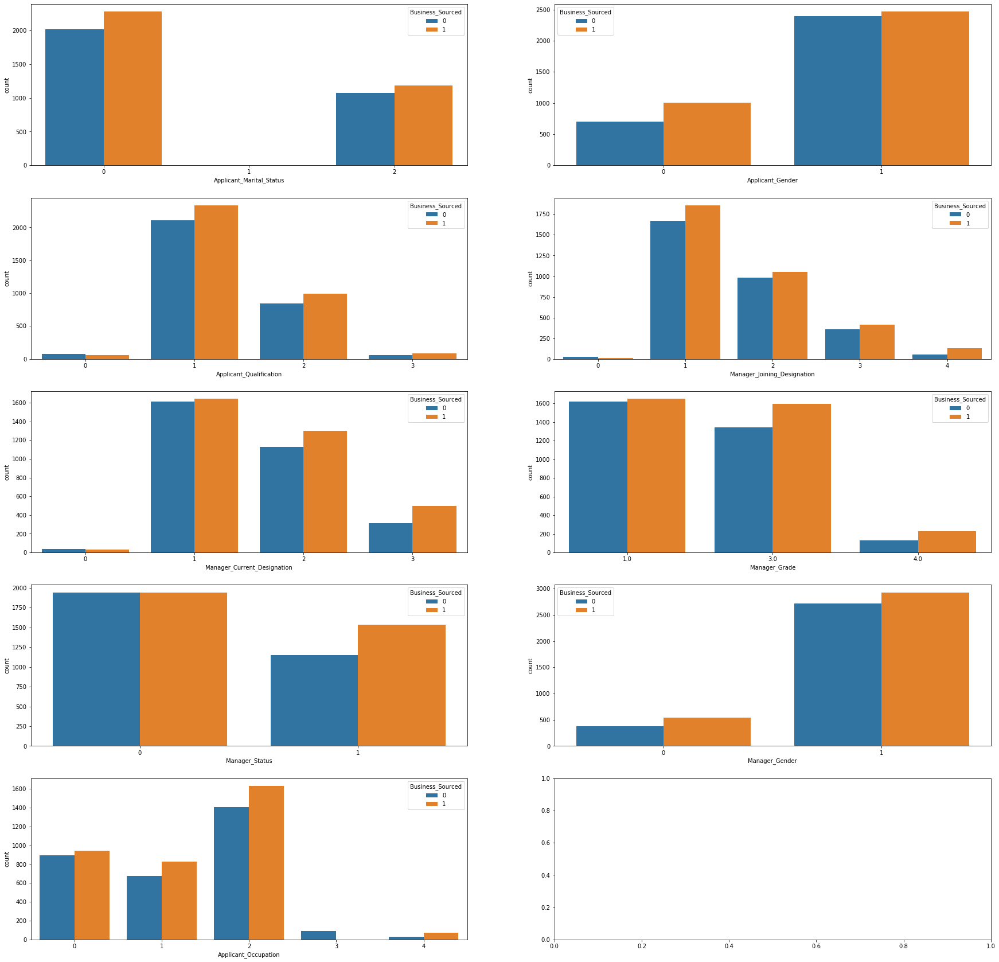

In [9]:
cat_features = ["Applicant_Marital_Status", "Applicant_Gender", "Applicant_Qualification", "Manager_Joining_Designation", "Manager_Current_Designation", "Manager_Grade", "Manager_Status", "Manager_Gender", "Applicant_Occupation"]
x,y =0,0

fig, ax = plt.subplots(math.ceil(len(cat_features)/2), 2, figsize=(30,30))
for feature in cat_features:
    if y ==2:
        x+=1
        y= 0
    sns.countplot(x=feature, hue="Business_Sourced", data=train, ax = ax[x][y])
    y+=1

| Important | Not Important 
| --- | --- |
| Applicant_Gender | Applicant_Marital_Status |
| Manager_Status | Manager_Joining_Designation |
| Applicant_Qualification |  Office_PIN|
| Manager_Gender                  |Applicant_City_PIN  |


In [10]:
train.columns

Index(['Office_PIN', 'Applicant_City_PIN', 'Applicant_Gender',
       'Applicant_Marital_Status', 'Applicant_Occupation',
       'Applicant_Qualification', 'Manager_Joining_Designation',
       'Manager_Current_Designation', 'Manager_Grade', 'Manager_Status',
       'Manager_Gender', 'Manager_Num_Application', 'Manager_Num_Coded',
       'Manager_Business', 'Manager_Num_Products', 'Manager_Business2',
       'Manager_Num_Products2', 'Business_Sourced', 'Manager_Age',
       'Applicant_Age', 'Manager_Experience', 'Manager_Promotion',
       'Applicant_Select'],
      dtype='object')

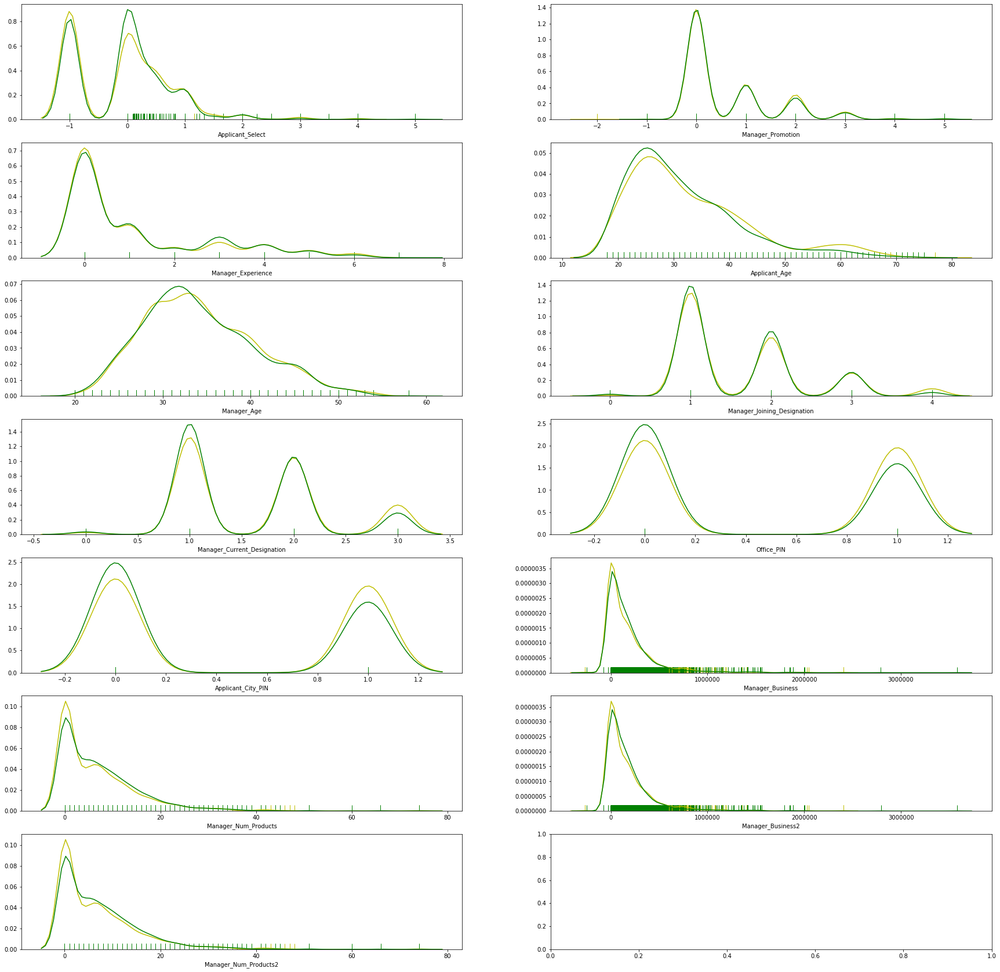

In [11]:
#dist plots
dist_features = ["Applicant_Select", "Manager_Promotion", "Manager_Experience", "Applicant_Age", "Manager_Age","Manager_Joining_Designation","Manager_Current_Designation","Office_PIN", "Applicant_City_PIN", "Manager_Business","Manager_Num_Products","Manager_Business2","Manager_Num_Products2"]
x,y =0,0

fig, ax = plt.subplots(math.ceil(len(dist_features)/2), 2, figsize=(30,30))
for feature in dist_features:
    if y ==2:
        x+=1
        y= 0
    t_1 = train.loc[train["Business_Sourced"] == 1]
    t_0 = train.loc[train["Business_Sourced"] == 0]
    sns.distplot(t_1[feature], color = "y", hist=False, rug=True, ax = ax[x][y])
    sns.distplot(t_0[feature],color = "g", hist=False, rug=True, ax = ax[x][y])
    y+=1

In [12]:
x = [0, 1, 2]
encoders["Applicant_Marital_Status"].inverse_transform(x)

array(['M', 'O', 'S'], dtype=object)

In [13]:
t_1 = train.loc[train["Applicant_Marital_Status"] == 0]
t_0 = train.loc[train["Applicant_Marital_Status"] == 2]
sns.distplot(t_1["Applicant_Age"], color = "y", hist=False, rug=True, ax = ax[x][y])
sns.distplot(t_0["Applicant_Age"],color = "g", hist=False, rug=True, ax = ax[x][y])


AttributeError: 'numpy.ndarray' object has no attribute 'plot'

In [14]:
def fillna(val):
    for feature in val.columns:
        if val[feature].isna().sum() ==0:
            continue
        if feature == "Applicant_City_PIN":
            val[feature] = val[feature].fillna(val["Office_PIN"])
            continue
        if feature == "Applicant_Gender":
            val[feature] = val[feature].fillna("M")
        if feature == "Applicant_BirthDate":
            birthdates = val["Application_Receipt_Date"].apply(lambda x: "01/01/"+ str( int(x.split("/")[-1]) - 25) )
            val[feature] = val[feature].fillna(birthdates)
        if feature == "Applicant_Marital_Status":
            st = val.apply( lambda x: "S" if int(x["Application_Receipt_Date"].split("/")[-1]) -  int(x["Applicant_BirthDate"].split("/")[-1]) <27 else "M", axis =  1)
            val[feature] = val[feature].fillna(st)
        if feature == "Manager_DoB":
            birthdates = val["Application_Receipt_Date"].apply(lambda x: "01/01/"+ str( int(x.split("/")[-1]) - 33) )
            val[feature] = val[feature].fillna(birthdates)
        else:
            val[feature] = val[feature].fillna(method = "ffill")
            val[feature] = val[feature].fillna(method = "bfill")

        
        

In [16]:
val = pd.read_csv("./data/val.csv")
val.head().T
fillna(val)

val = create_features(val, "test")
val.isna().sum()

Office_PIN                     0
Applicant_City_PIN             0
Applicant_Gender               0
Applicant_Marital_Status       0
Applicant_Occupation           0
Applicant_Qualification        0
Manager_Joining_Designation    0
Manager_Current_Designation    0
Manager_Grade                  0
Manager_Status                 0
Manager_Gender                 0
Manager_Num_Application        0
Manager_Num_Coded              0
Manager_Business               0
Manager_Num_Products           0
Manager_Business2              0
Manager_Num_Products2          0
Business_Sourced               0
Manager_Age                    0
Applicant_Age                  0
Manager_Experience             0
Manager_Promotion              0
Applicant_Select               0
dtype: int64

In [17]:
#computer AUCROC
from sklearn.metrics import roc_auc_score
def get_score( preds, gt ):
    return roc_auc_score( gt, preds)

In [18]:
X_train = train.drop("Business_Sourced", axis = 1)
X_test = val.drop("Business_Sourced", axis = 1)
y_train = train["Business_Sourced"]
y_test = val["Business_Sourced"]

In [25]:
import numpy as np

import matplotlib.pyplot as plt
#import seaborn as sns
#from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier #RandomForestRegressor
#from sklearn.feature_selection import SelectFromModel

# 2018.11.27 Created by Eamon.Zhang

def rf_importance(X_train,y_train,max_depth=10,class_weight=None,top_n=15,n_estimators=50,random_state=0):
    
    model = RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth,
                                    random_state=random_state,class_weight=class_weight,
                                    n_jobs=-1)
    model.fit(X_train, y_train)
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    feat_labels = X_train.columns
    std = np.std([tree.feature_importances_ for tree in model.estimators_],
                 axis=0) #  inter-trees variability. 
    print("Feature ranking:") 
#    l1,l2,l3,l4 = [],[],[],[]
    for f in range(X_train.shape[1]):
        print("%d. feature no:%d feature name:%s (%f)" % (f + 1, indices[f], feat_labels[indices[f]], importances[indices[f]]))
#        l1.append(f+1)
#        l2.append(indices[f])
#        l3.append(feat_labels[indices[f]])
#        l4.append(importances[indices[f]])
    #feature_rank = pd.Dataframe(zip(l1,l2,l3,l4),columns=['id','indice','feature','importances'])
    
    # plotting
    indices = indices[0:top_n]
    plt.figure()
    plt.title("Feature importances top %d" % top_n)
    plt.bar(range(top_n), importances[indices],
           color="r", yerr=std[indices], align="center")
    plt.xticks(range(top_n), indices)
    plt.xlim([-1,top_n])
    plt.show() 
    
    return model

Feature ranking:
1. feature no:18 feature name:Applicant_Age (0.122418)
2. feature no:15 feature name:Manager_Business2 (0.088953)
3. feature no:13 feature name:Manager_Business (0.081917)
4. feature no:17 feature name:Manager_Age (0.080173)
5. feature no:21 feature name:Applicant_Select (0.076828)
6. feature no:11 feature name:Manager_Num_Application (0.067171)
7. feature no:4 feature name:Applicant_Occupation (0.064874)
8. feature no:14 feature name:Manager_Num_Products (0.051810)
9. feature no:16 feature name:Manager_Num_Products2 (0.049428)
10. feature no:12 feature name:Manager_Num_Coded (0.038511)
11. feature no:7 feature name:Manager_Current_Designation (0.031392)
12. feature no:20 feature name:Manager_Promotion (0.030940)
13. feature no:19 feature name:Manager_Experience (0.030375)
14. feature no:5 feature name:Applicant_Qualification (0.027408)
15. feature no:2 feature name:Applicant_Gender (0.027296)
16. feature no:6 feature name:Manager_Joining_Designation (0.025432)
17. fea

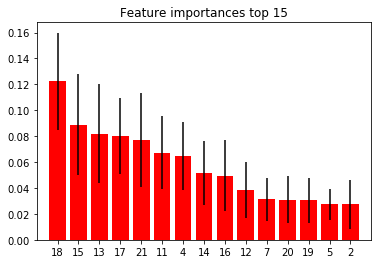

In [30]:
#Feature Selection
model = rf_importance(X_train=X_train,y_train=y_train,
                             max_depth=8,top_n=15)

In [31]:
preds = model.predict(X_test)
print(get_score(preds, y_test.values))

preds = model.predict(X_train)
print(get_score(preds, y_train.values))

0.5357142857142857
0.7430974857288923


In [32]:
test = pd.read_csv("./data/Test.csv")
test.head().T
fillna(test)
test = create_features(test, "test")
test.isna().sum()

Office_PIN                     0
Applicant_City_PIN             0
Applicant_Gender               0
Applicant_Marital_Status       0
Applicant_Occupation           0
Applicant_Qualification        0
Manager_Joining_Designation    0
Manager_Current_Designation    0
Manager_Grade                  0
Manager_Status                 0
Manager_Gender                 0
Manager_Num_Application        0
Manager_Num_Coded              0
Manager_Business               0
Manager_Num_Products           0
Manager_Business2              0
Manager_Num_Products2          0
Manager_Age                    0
Applicant_Age                  0
Manager_Experience             0
Manager_Promotion              0
Applicant_Select               0
dtype: int64

In [36]:
assert (test.columns == X_train.columns).all()

In [38]:
preds = model.predict(test)
from create_submission import create_submission

create_submission(preds, "Random_Forest")

saved_submission:  Random_Forest
